# Pixeltable Processing Pipeline


In this notebook, we'll explore the video processing pipeline we've implemented using Pixeltable. The idea is to get an intuition of what Pixeltable does and also understand what the MCP server will be doing under the hood.


If you want to add your own videos for this notebook, please make sure you have converted them using this command:

`make convert-video input=<input_video_path> output=<output_video_path>`


In [3]:
from dotenv import load_dotenv

load_dotenv()

True

In [4]:
video_path = "./data/pass_the_butter_rick_and_morty.mp4"

### Creating the video table and inserting the video


In [5]:
import pixeltable as pxt

pxt.drop_dir("test", force=True)
pxt.create_dir("test")

video_table = pxt.create_table(
    "test.videos", schema={"video": pxt.Video}, if_exists="replace_force"
)

Connected to Pixeltable database at: postgresql+psycopg://postgres:@/pixeltable?host=/Users/moteroperdido/.pixeltable/pgdata
Created directory 'test'.
Created table `videos`.


In [6]:
video_table.insert([{"video": video_path}])

Inserting rows into `videos`: 1 rows [00:00, 21.45 rows/s]
Inserted 1 row with 0 errors.


UpdateStatus(num_rows=1, num_computed_values=2, num_excs=0, updated_cols=[], cols_with_excs=[])

video
""

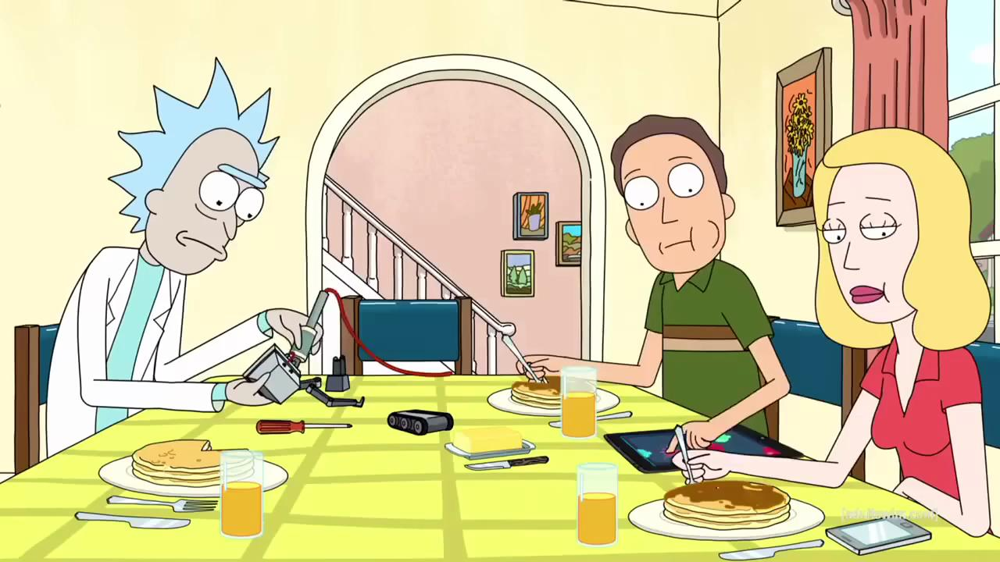

In [7]:
video_table.show()

Do you recognise this Rick & Morty episode?


### Step 1: Extracting the audio from the video


Added 1 column value with 0 errors.


video,audio
,

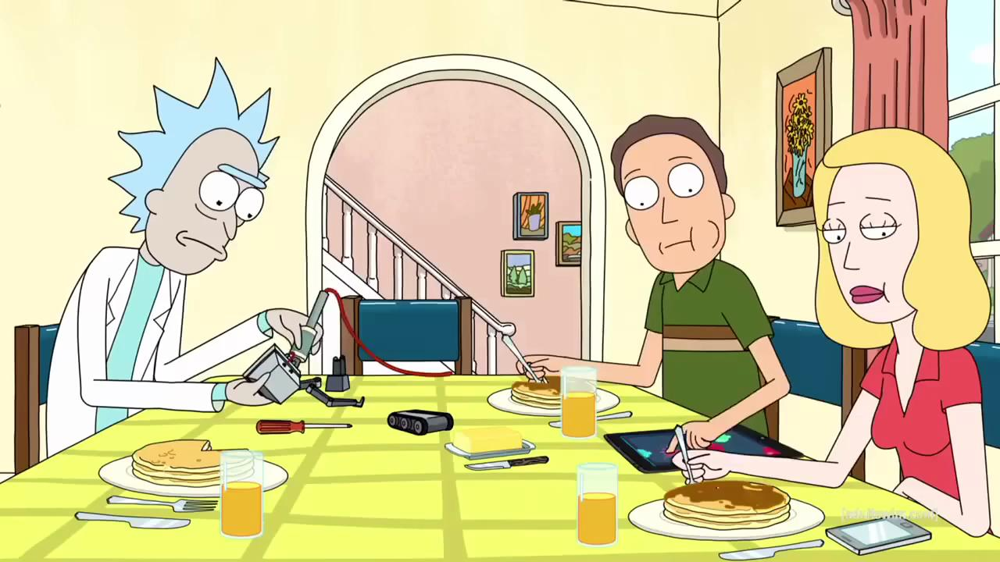

In [7]:
from pixeltable.functions.video import extract_audio

video_table.add_computed_column(
    audio=extract_audio(video_table.video, format="mp3"), if_exists="ignore"
)
video_table.show()

As you can see in the table above, we have two columns now. One column contains the video, and the other column contains the audio. Now, we need to split the audio into chunks.


### Step 2: Splitting the audio


In [8]:
from pixeltable.iterators.audio import AudioSplitter

audio_view = pxt.create_view(
    "test.audio_chunks",
    video_table,
    iterator=AudioSplitter.create(
        audio=video_table.audio,
        chunk_duration_sec=5.0,
        overlap_sec=1.0,
        min_chunk_duration_sec=5.0,
    ),
    if_exists="ignore",
)

Inserting rows into `audio_chunks`: 14 rows [00:00, 1096.75 rows/s]
Created view `audio_chunks` with 14 rows, 0 exceptions.


pos,start_time_sec,end_time_sec,audio_chunk,video,audio
0,0.023,5.016,,,
1,4.032,9.,,,

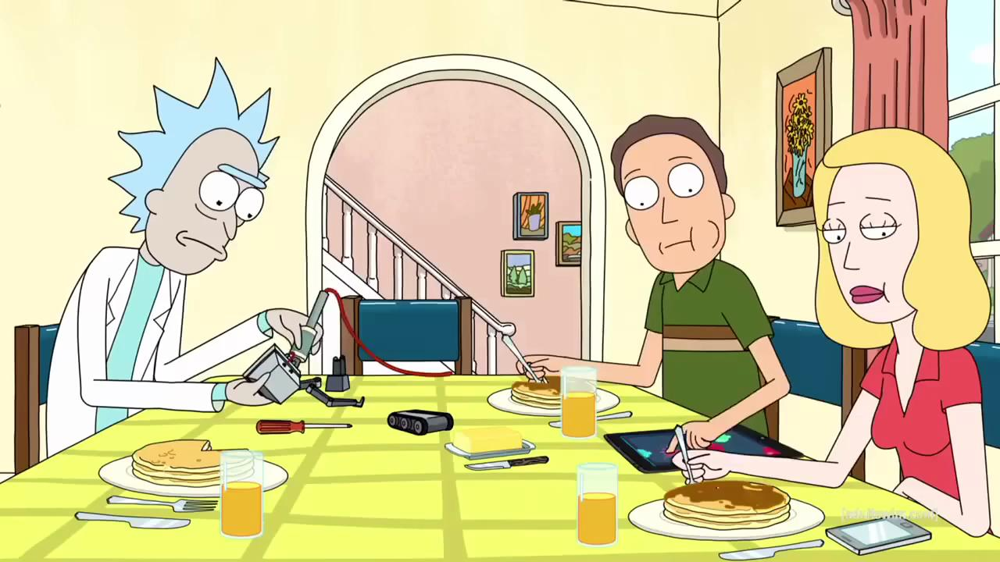
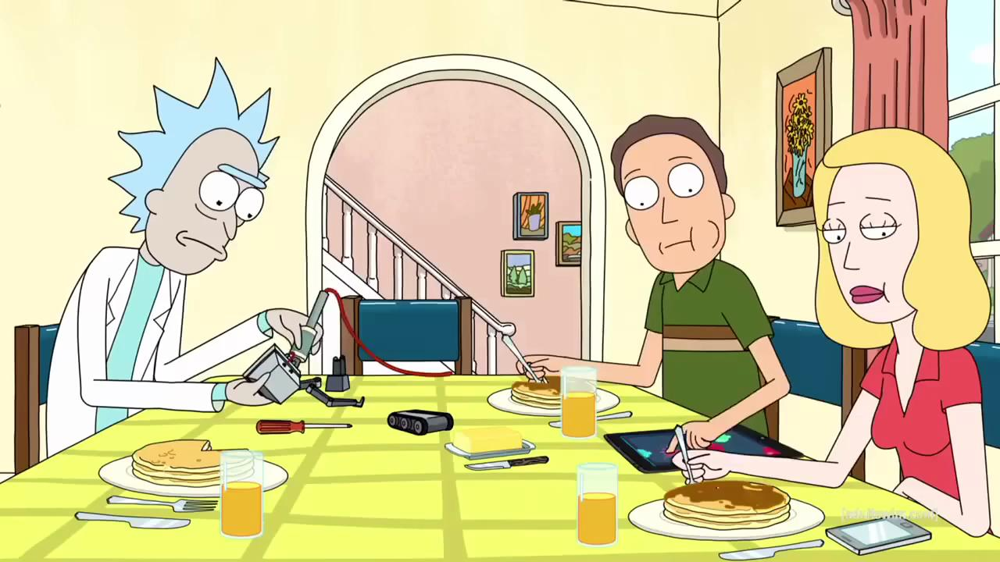

In [9]:
audio_view.show(2)

Notice that, apart from the `audio_chunk` column, we also have two additional columns, giving information about the start and end time in seconds.


### Step 3: Transcription with Whisper


In [10]:
from pixeltable.functions import whisper

audio_view.add_computed_column(
    transcription=whisper.transcribe(audio=audio_view.audio_chunk, model="base.en"),
)

/Users/moteroperdido/Desktop/projects/the_neural_maze/projects/multimodal-agents-course/mcp-server/.venv/lib/python3.12/site-packages/whisper/transcribe.py:126: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")
/Users/moteroperdido/Desktop/projects/the_neural_maze/projects/multimodal-agents-course/mcp-server/.venv/lib/python3.12/site-packages/whisper/transcribe.py:126: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")
/Users/moteroperdido/Desktop/projects/the_neural_maze/projects/multimodal-agents-course/mcp-server/.venv/lib/python3.12/site-packages/whisper/transcribe.py:126: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")
/Users/moteroperdido/Desktop/projects/the_neural_maze/projects/multimodal-agents-course/mcp-server/.venv/lib/python3.12/site-pa

Added 14 column values with 0 errors.


UpdateStatus(num_rows=14, num_computed_values=14, num_excs=0, updated_cols=[], cols_with_excs=[])

pos,start_time_sec,end_time_sec,audio_chunk,transcription,video,audio
0,0.023,5.016,,"{""text"": "" Hey Rick, I have to make a project for the science fair this week."", ""language"": ""en"", ""segments"": [{""id"": 0, ""end"": 5., ""seek"": 0, ""text"": "" Hey Rick, I have to make a project for the science fair this week."", ""start"": 0., ""tokens"": [50363, 14690, 8759, 11, 314, 423, ..., 3783, 3148, 428, 1285, 13, 50613], ""avg_logprob"": -0.319, ""temperature"": 0., ""no_speech_prob"": 0.177, ""compression_ratio"": 0.957}]}",,

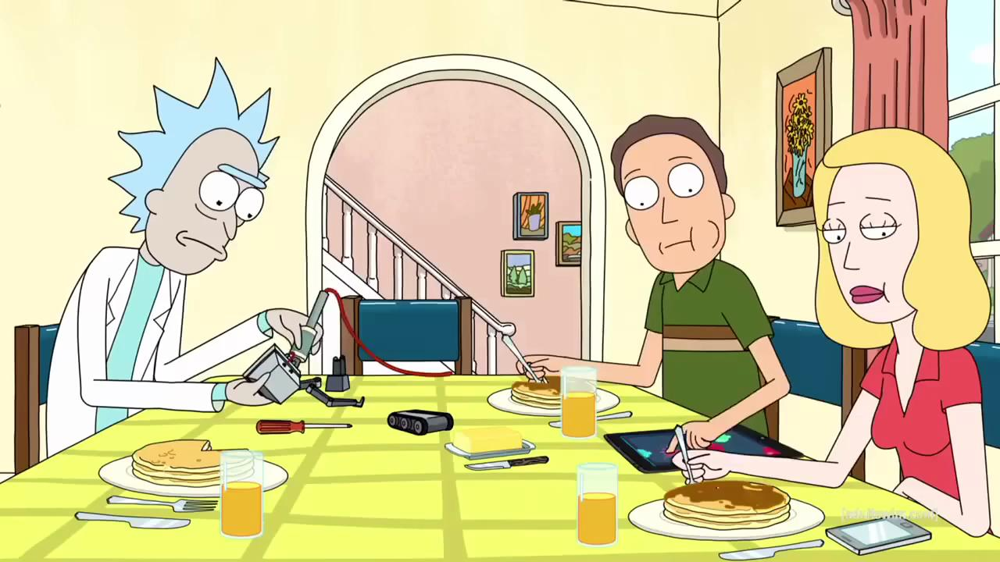

In [11]:
audio_view.order_by(audio_view.pos).show(1)

A new column has appeared, containing the transcription about the corresponding audio chunk! If you look at the content, you'll notice it has a lot of metadata information. We just need the `text` attribute.


### Step 4: Extracting the text from the transcription


In [15]:
from mcp_server.video.ingestion.functions import extract_text_from_chunk

audio_view.add_computed_column(
    chunk_text=extract_text_from_chunk(audio_view.transcription),
    if_exists="ignore",
)

Added 14 column values with 0 errors.


UpdateStatus(num_rows=14, num_computed_values=14, num_excs=0, updated_cols=[], cols_with_excs=[])

pos,start_time_sec,end_time_sec,audio_chunk,transcription,chunk_text,video,audio
0,0.023,5.016,,"{""text"": "" Hey Rick, I have to make a project for the science fair this week."", ""language"": ""en"", ""segments"": [{""id"": 0, ""end"": 5., ""seek"": 0, ""text"": "" Hey Rick, I have to make a project for the science fair this week."", ""start"": 0., ""tokens"": [50363, 14690, 8759, 11, 314, 423, ..., 3783, 3148, 428, 1285, 13, 50613], ""avg_logprob"": -0.319, ""temperature"": 0., ""no_speech_prob"": 0.177, ""compression_ratio"": 0.957}]}","Hey Rick, I have to make a project for the science fair this week.",,

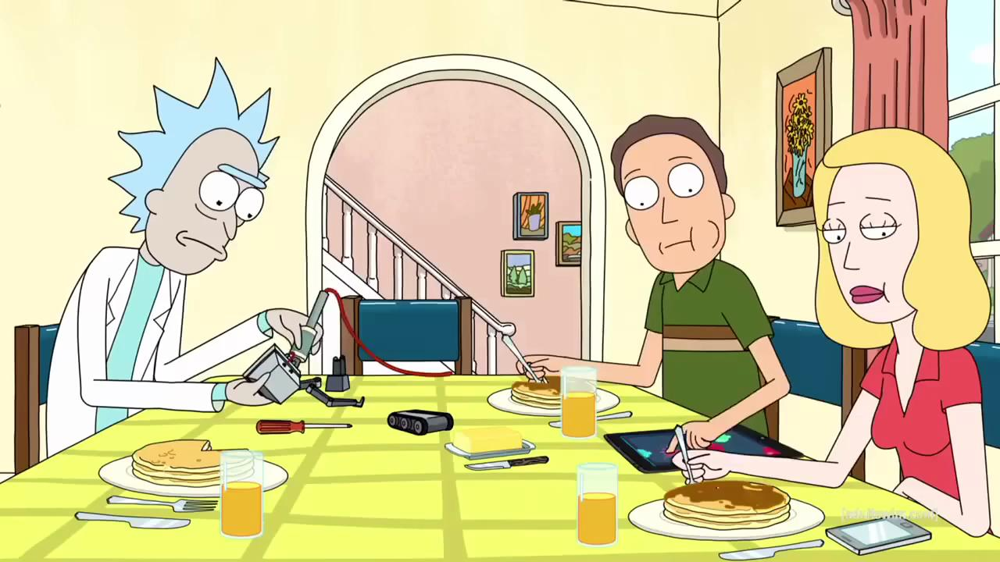

In [16]:
audio_view.order_by(audio_view.pos).show(1)

If you look at the `chunk_text` column, you'll see the text transcription (just the string).


### Step 5: Creating an embedding index for audio transcriptions


In [17]:
from pixeltable.functions.huggingface import sentence_transformer

audio_view.add_embedding_index(
    column=audio_view.chunk_text,
    string_embed=sentence_transformer.using(model_id="intfloat/e5-large-v2"),
    if_exists="ignore",
    idx_name="chunks_index",
)

You can check how this embedding index works by passing some query. The code below will take care of check the most similar audio_chunk to the user query.


In [18]:
audio_sims = audio_view.chunk_text.similarity("Pass the butter")

In [19]:
results = audio_view.select(
    audio_view.pos,
    audio_view.start_time_sec,
    audio_view.end_time_sec,
    similarity=audio_sims,
).order_by(audio_sims, asc=False)

In [20]:
top_k_entry = results.limit(1).collect()[0]

In [21]:
top_k_entry

{'pos': 8,
 'start_time_sec': 32.04,
 'end_time_sec': 37.0081,
 'similarity': 0.8820397924161096}

We can check the clip by using the `extract_video_clip` helper function.


In [23]:
from mcp_server.video.ingestion.tools import extract_video_clip

video_clip = extract_video_clip(
    video_path=video_path,
    start_time=top_k_entry["start_time_sec"],
    end_time=top_k_entry["end_time_sec"],
    output_path="./data/pass_the_butter_clip_sim_audio.mp4",
)

MoviePy - Building video ./data/pass_the_butter_clip_sim_audio.mp4.
MoviePy - Writing audio in pass_the_butter_clip_sim_audioTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
MoviePy - Writing video ./data/pass_the_butter_clip_sim_audio.mp4



MoviePy - Done !
MoviePy - video ready ./data/pass_the_butter_clip_sim_audio.mp4


In [24]:
from IPython.display import Video

Video(video_clip.filename)

### Step 6: Splitting the video in frames


In [8]:
from pixeltable.iterators.video import FrameIterator

frames_view = pxt.create_view(
    "test.frames_view",
    video_table,
    iterator=FrameIterator.create(video=video_table.video, fps=0.5),
    if_exists="ignore",
)

Inserting rows into `frames_view`: 31 rows [00:00, 6522.04 rows/s]
Created view `frames_view` with 31 rows, 0 exceptions.


pos,frame_idx,pos_msec,pos_frame,frame,video
0,0,0.,0,,
1,1,2002.,60,,
2,2,4004.,120,,

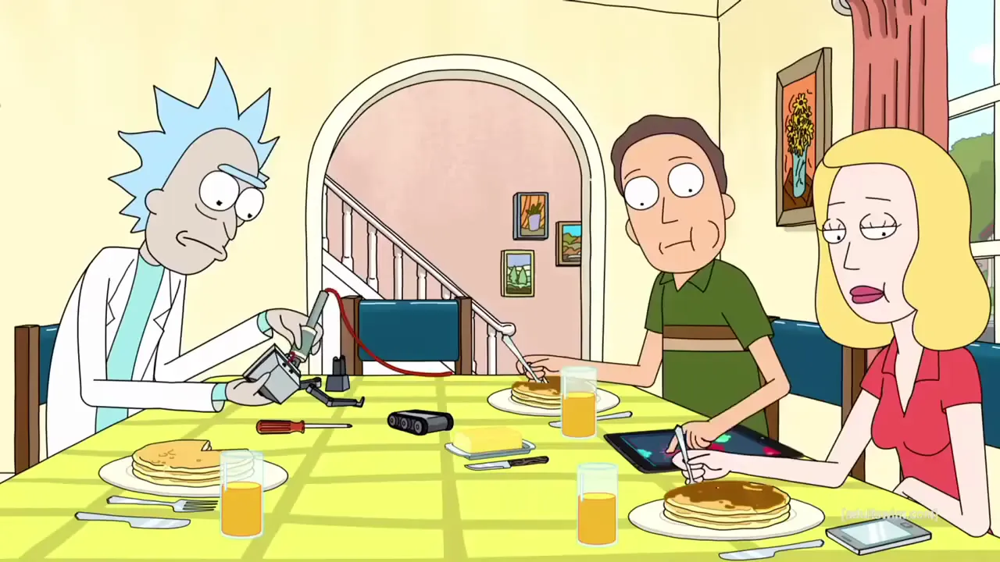
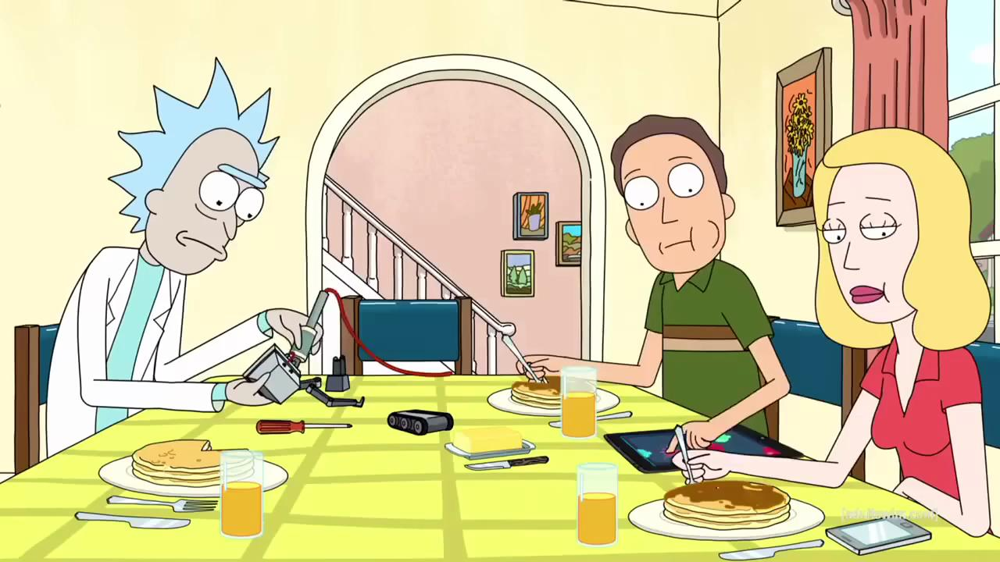
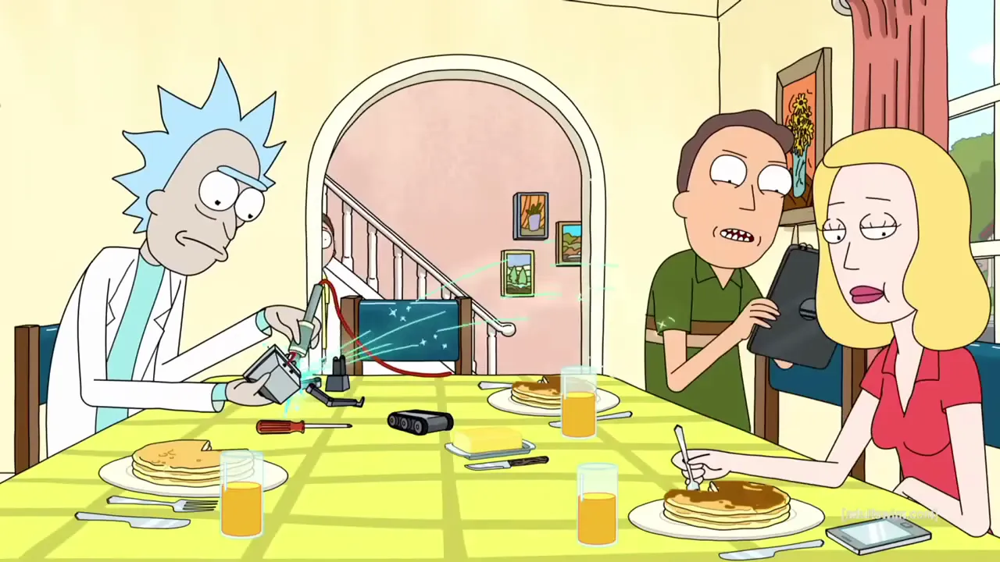
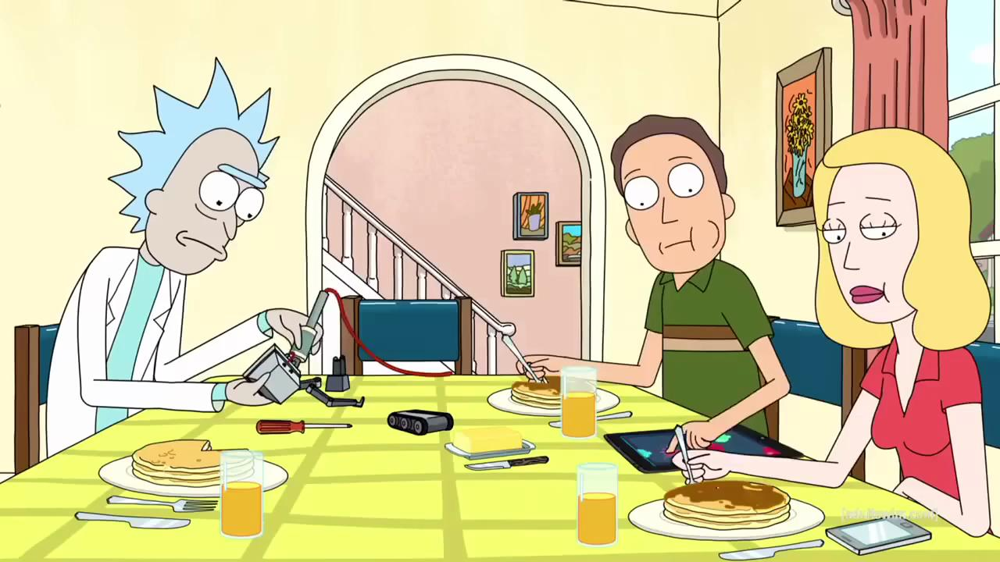
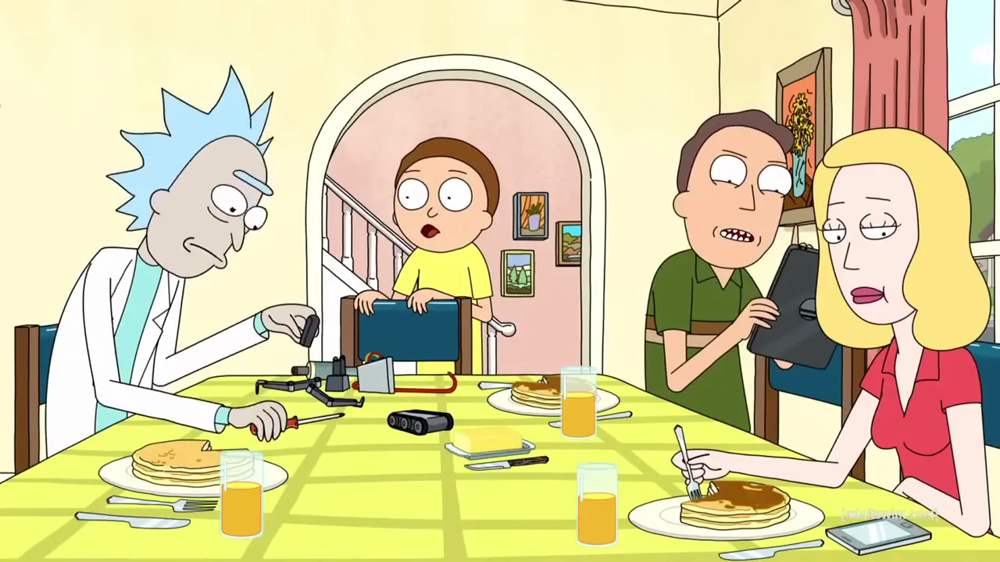
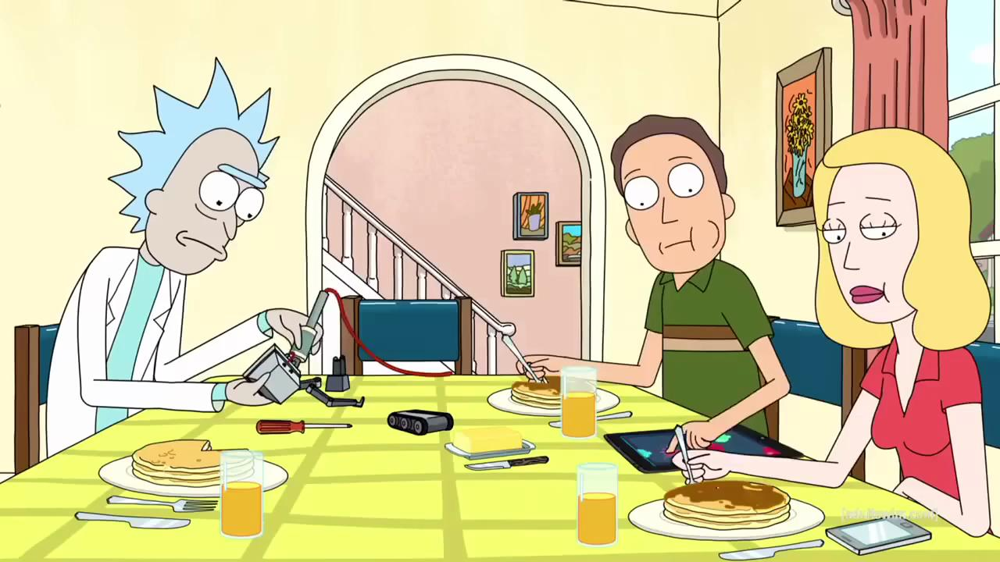

In [9]:
frames_view.show(3)

To access visual content, we need to sample the video, placing each frame in a row. After that, we just need to create an embedding index for the frames. We'll use CLIP embeddings for this one.


### Step 7: Creating frame embedding index


In [10]:
from pixeltable.functions.huggingface import clip

frames_view.add_embedding_index(
    column=frames_view.frame,
    image_embed=clip.using(model_id="openai/clip-vit-base-patch32"),
)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


As we did with the audio embedding index, we can also provide an image and check the clip more similar to it. For example, let's use the following picture.


In [11]:
from PIL import Image

img = Image.open("./data/sad_robot.png")

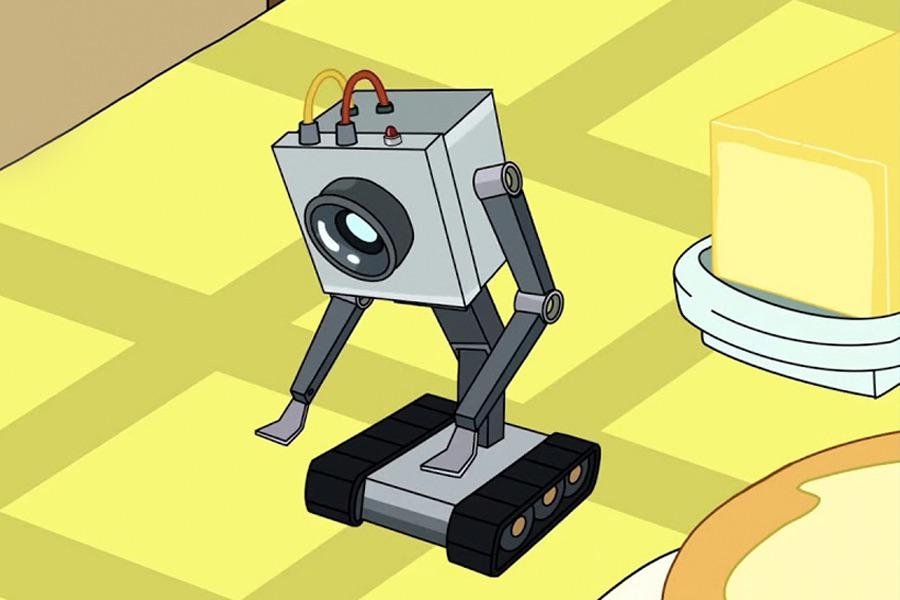

In [12]:
img

In [13]:
image_sims = frames_view.frame.similarity(img)

In [14]:
results = frames_view.select(
    frames_view.pos_msec,
    frames_view.frame,
    similarity=image_sims,
).order_by(image_sims, asc=False)

In [15]:
top_k_entry = results.limit(1).collect()[0]

In [16]:
top_k_entry

{'pos_msec': 55989.26666666667,
 'frame': <PIL.Image.Image image mode=RGB size=1280x720>,
 'similarity': 0.9272637085594415}

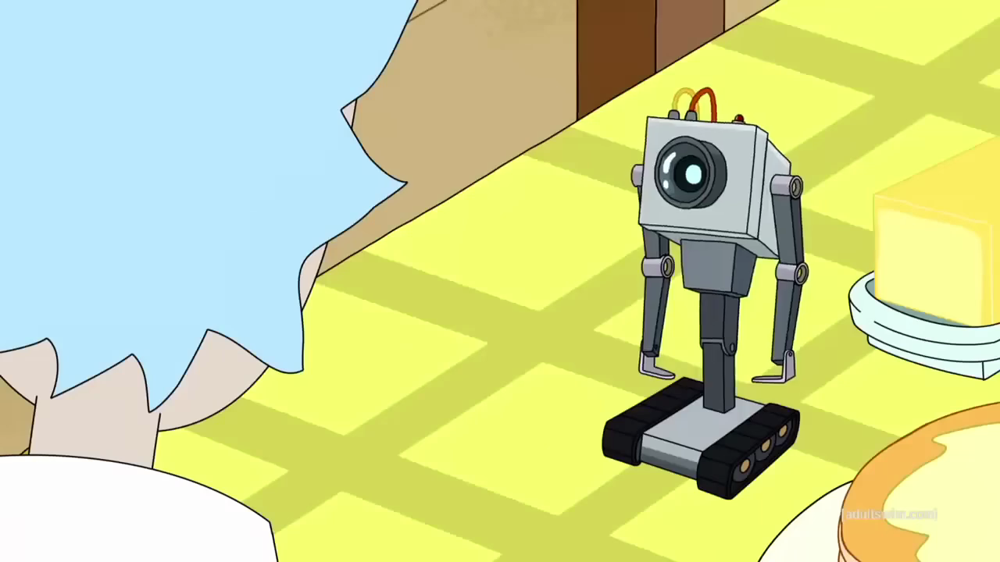

In [17]:
top_k_entry["frame"]

In [18]:
from mcp_server.video.ingestion.tools import extract_video_clip

video_clip = extract_video_clip(
    video_path=video_path,
    start_time=top_k_entry["pos_msec"] / 1000.0 - 3,
    end_time=top_k_entry["pos_msec"] / 1000.0 + 3,
    output_path="./data/pass_the_butter_clip_sim_image.mp4",
)

OPIK: Configuration saved to file: /Users/moteroperdido/.opik.config
2025-06-15 13:20:43.543 | INFO     | mcp_server.opik_utils:configure:32 - Opik configured successfully using workspace 'the-neural-maze'


MoviePy - Building video ./data/pass_the_butter_clip_sim_image.mp4.
MoviePy - Writing audio in pass_the_butter_clip_sim_imageTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
MoviePy - Writing video ./data/pass_the_butter_clip_sim_image.mp4



MoviePy - Done !
MoviePy - video ready ./data/pass_the_butter_clip_sim_image.mp4


In [19]:
from IPython.display import Video

Video(video_clip.filename)

### Step 8: Add captions for each frame


In [20]:
from mcp_server.video.ingestion.functions import caption_image

frames_view.add_computed_column(
    im_caption=caption_image(
        image=frames_view.frame,
        prompt="Describe what you see in the image in just one sentence.",
    ),
    if_exists="replace",
)

Error: Error while evaluating computed column `im_caption`:
Error code: 429 - {'error': {'message': 'Rate limit reached for model `meta-llama/llama-4-scout-17b-16e-instruct` in organization `org_01hw5dr6safs7brt090ewbxmw8` service tier `on_demand` on tokens per minute (TPM): Limit 30000, Used 33608, Requested 19. Please try again in 7.254s. Need more tokens? Upgrade to Dev Tier today at https://console.groq.com/settings/billing', 'type': 'tokens', 'code': 'rate_limit_exceeded'}}

pos,frame_idx,pos_msec,pos_frame,frame,im_caption,video
30,30,59993.267,1798,,"The image shows Rick Sanchez enthusiastically eating pancakes with a fork in his hand, while sitting at a table with various objects around him, including a robot and a clock.",
0,0,0.,0,,"The image shows a scene from Rick and Morty, with Rick, Morty, and Summer sitting at a table eating pancakes while distracted by various technology devices.",
1,1,2002.,60,,The image shows Rick from Rick and Morty sitting at a table with a woman and a man while holding a device and pointing it at the man.,
2,2,4004.,120,,"The image depicts a scene from Rick and Morty, showing Rick, Morty, Summer, Jerry, and Beth sitting around a table with a yellow tablecloth, looking shocked or surprised.",
3,3,6006.,180,,The image shows an animated scene of a family having breakfast together at a table.,
4,4,8008.,240,,"The image depicts a cartoon scene of a man and woman sitting at a table with plates of pancakes, holding up a tablet while a young boy stands beside them.",
5,5,10010.,300,,The image depicts a cartoon scene of three family members sitting at a breakfast table with plates of pancakes and glasses of orange juice.,
6,6,12012.,360,,"The image depicts a family sitting at a table with pancakes and drinks, where the parents are engrossed in their devices while the child stands by his chair looking unhappy.",
7,7,14014.,420,,"The image depicts Rick Sanchez from Rick and Morty sitting at a table, with an annoyed expression on his face as he holds a knife.",
8,8,16016.,480,,The image depicts a scene from Rick and Morty where a family of three sit around a table eating pancakes while looking at their cell phones.,

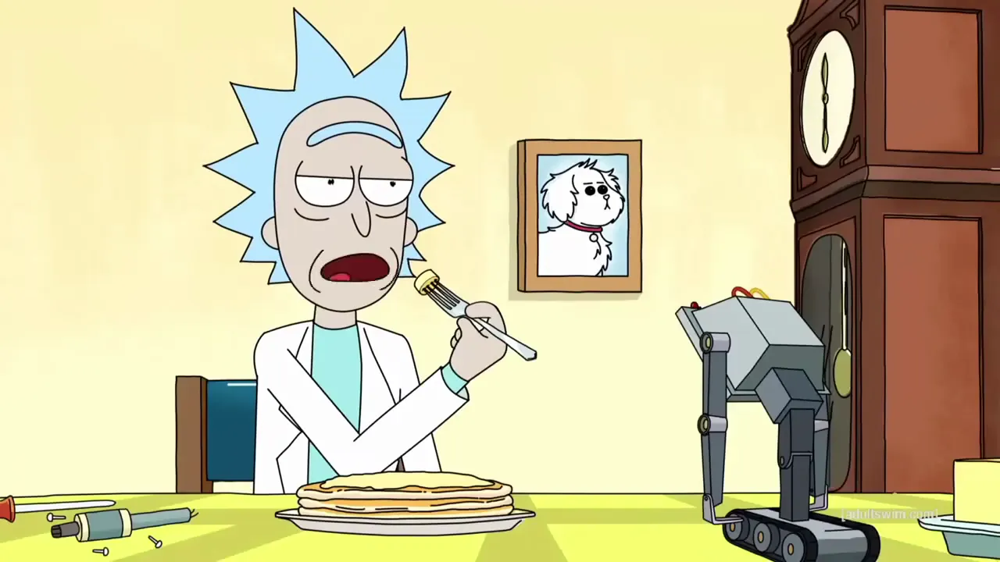
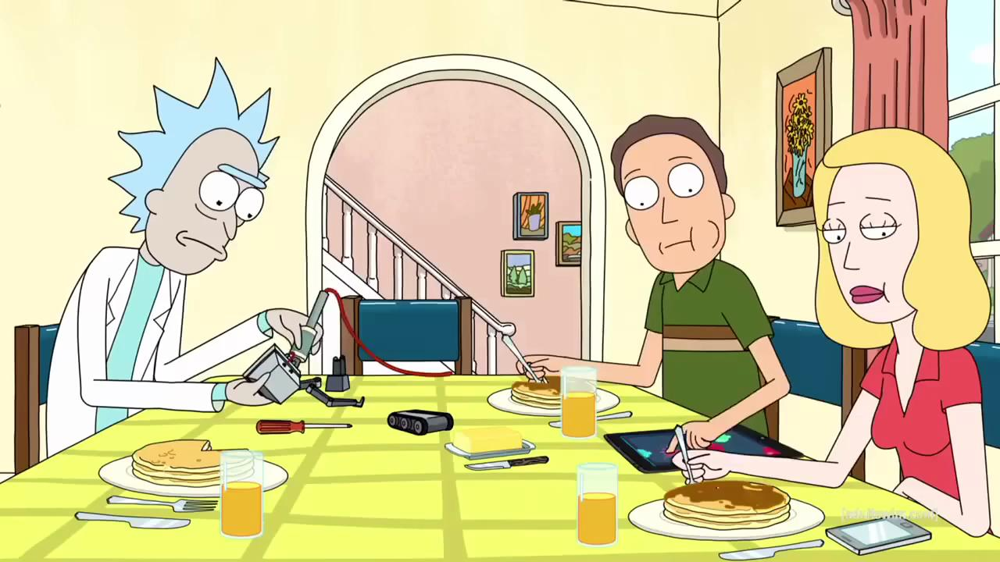
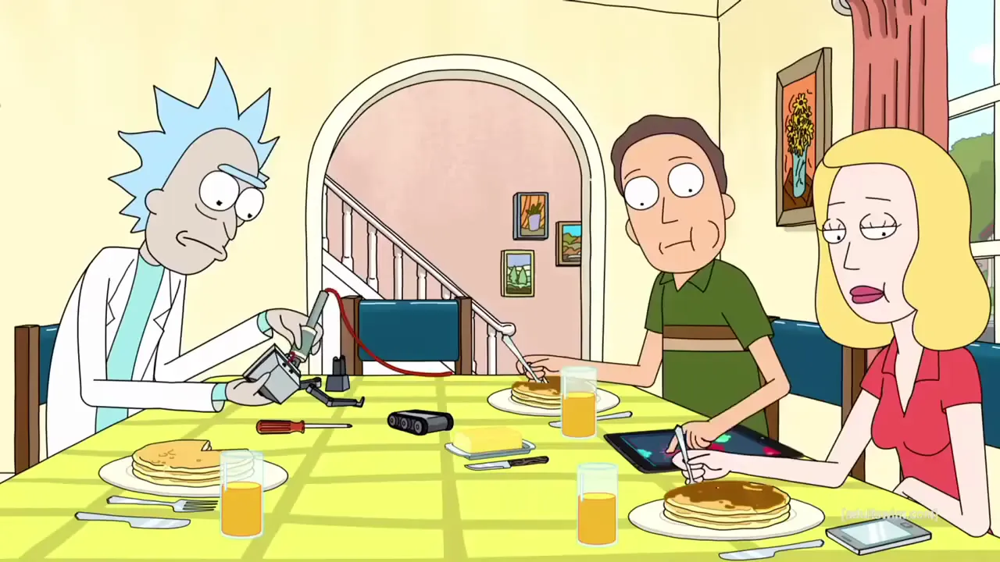
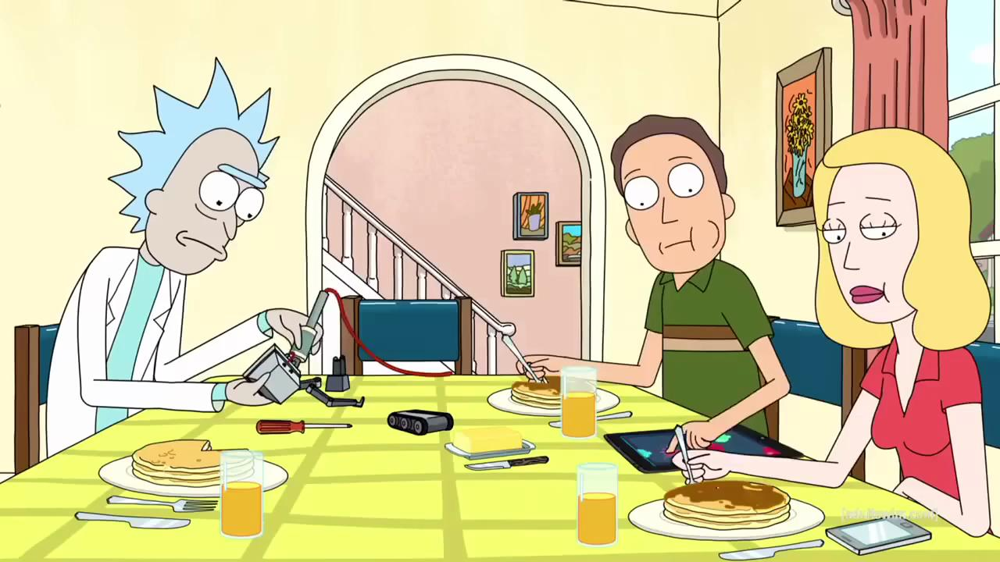
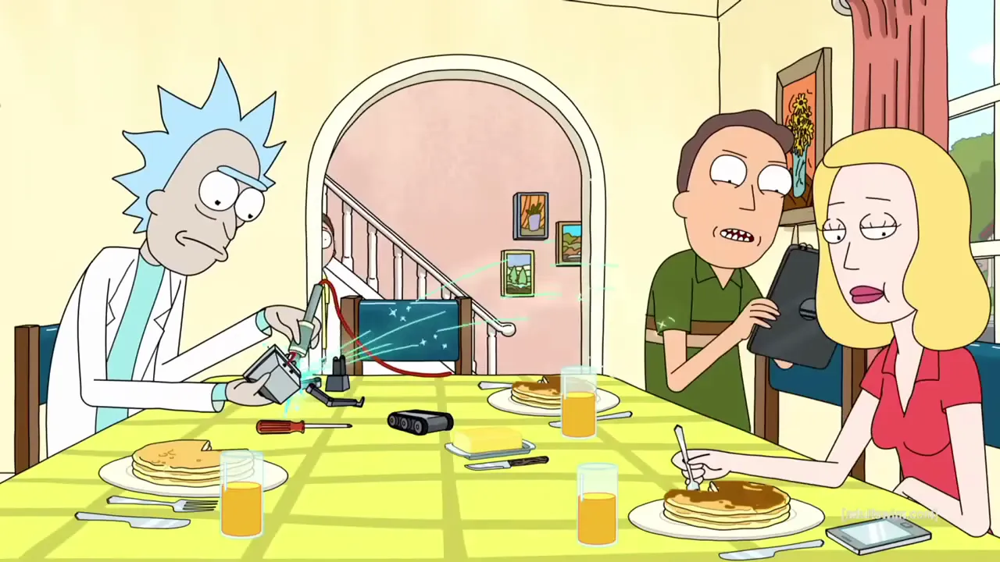
...
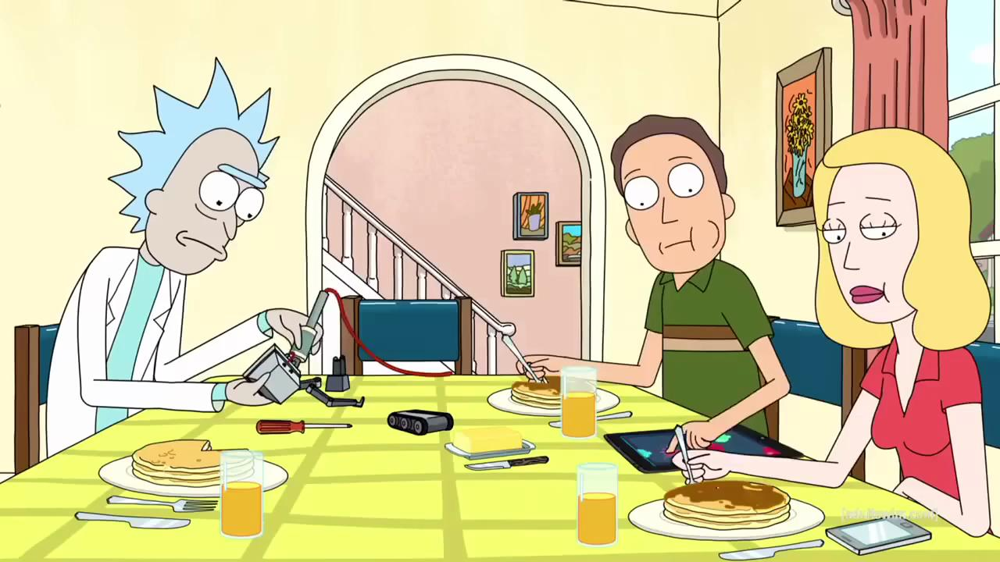
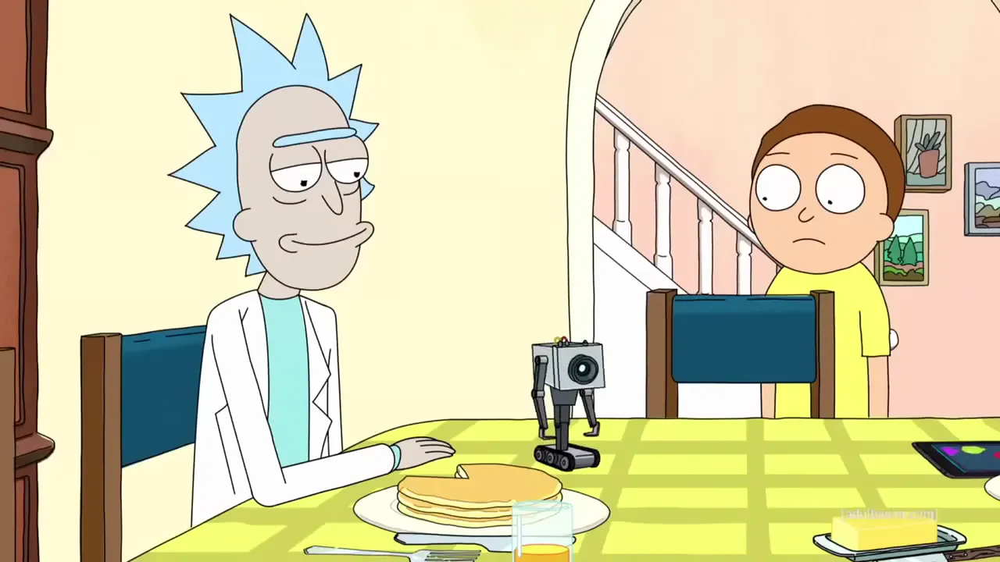
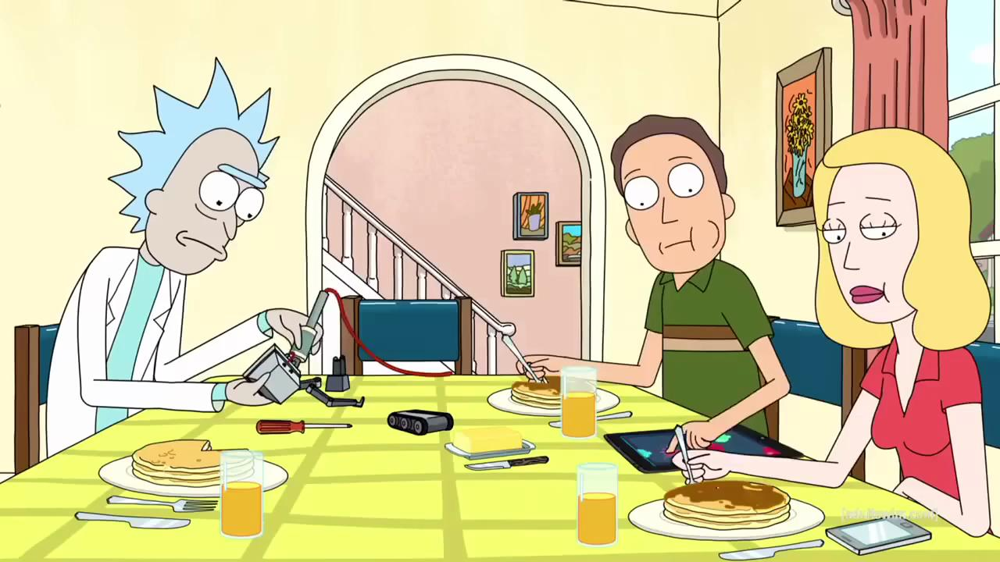
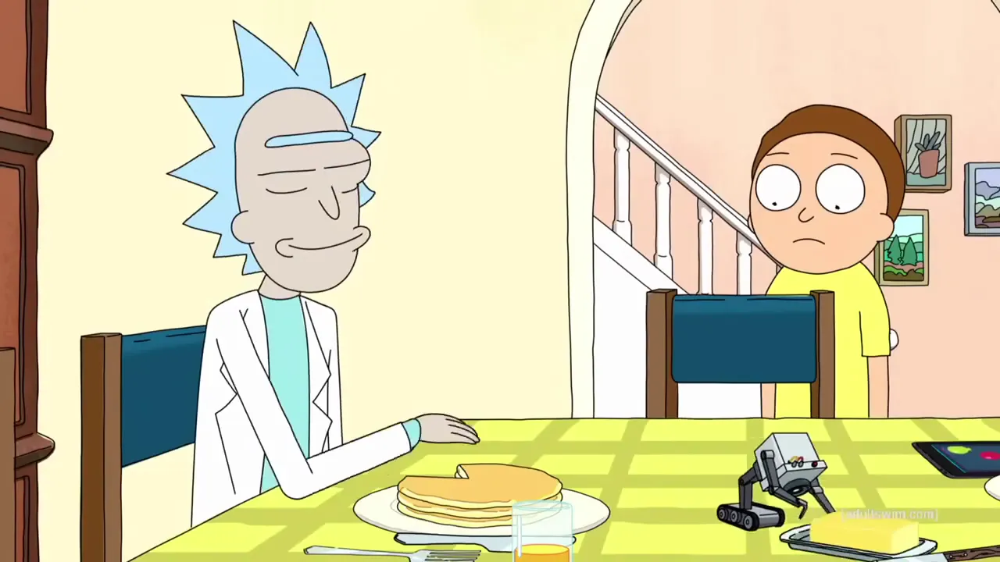
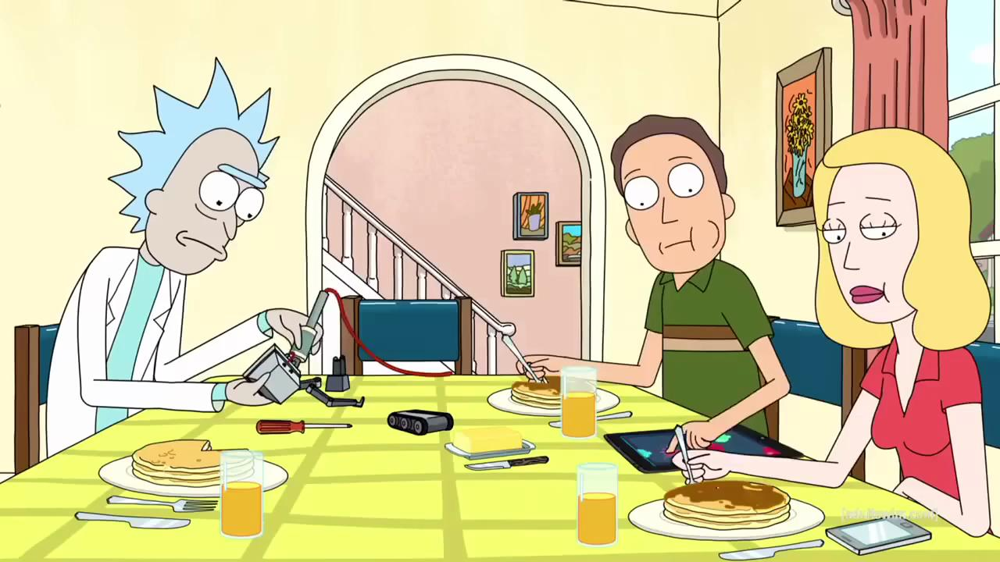

In [21]:
frames_view.show(100)

### Step 9: Creating caption embedding index


In [ ]:
frames_view.add_embedding_index(
    column=frames_view.im_caption,
    string_embed=clip.using(model_id="openai/clip-vit-base-patch32"),
)

In [ ]:
caption_sims = frames_view.im_caption.similarity(
    "Your father is insecure about his intelligence"
)

In [ ]:
caption_sims

In [ ]:
results = frames_view.select(
    frames_view.pos_msec,
    frames_view.im_caption,
    similarity=caption_sims,
).order_by(caption_sims, asc=False)

In [ ]:
top_k_entry = results.limit(1).collect()[0]

In [ ]:
top_k_entry

In [ ]:
from mcp_server.video_ingestion.tools import extract_video_clip

video_clip = extract_video_clip(
    video_path=video_path,
    start_time=top_k_entry["pos_msec"] / 1000.0 - 3,
    end_time=top_k_entry["pos_msec"] / 1000.0 + 3,
    output_path="./data/pass_the_butter_clip_sim_caption.mp4",
)

In [ ]:
from IPython.display import Video

Video(video_clip.filename)

### Conclusion


These three embedding indexes will be used used by our MCP Server to fetch the most relevant content from the videos. But of course, the Agent won't be aware of the inner workings, since that's exactly the goal of the MCP Server!
